In [1]:
# check pytorch installation: 
import torch, torchvision
# assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version
print(torch.__version__, torch.cuda.is_available())

c:\Users\user\Desktop\RCP\ClimbAssistant\.venv\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


1.12.1+cu116 True


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger

# import some common libraries
import numpy as np
import os, json, cv2, random
import matplotlib.pyplot as plt
import json
import pandas as pd
from scipy.interpolate import make_interp_spline

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Register COCO dataset

In [3]:
# specify paths
train_path = 'C:/Users/user/Desktop/boulder photos/iter3/train'
output_path = 'C:/Users/user/Desktop/boulder photos/iter3/output_lrplateau'
display_path = 'C:/Users/user/Desktop/boulder photos/iter3/display_lrplateau'

In [4]:
# register new custom datasets to their catalog
register_coco_instances("train", {}, f'{train_path}/annotations.json', train_path)
dataset_dicts = DatasetCatalog.get('train')
train_metadata = MetadataCatalog.get('train')


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

Filtered out 56 instances without valid segmentation. There might be issues in your dataset generation process.  Please check https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html carefully


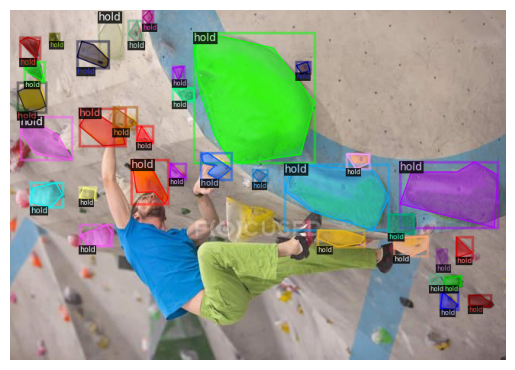

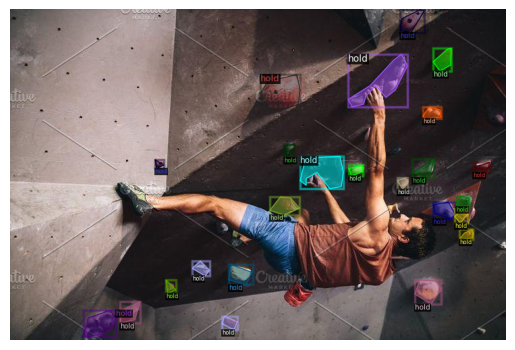

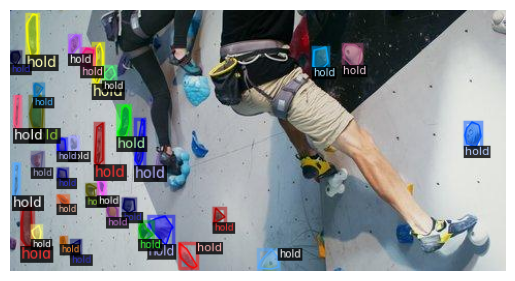

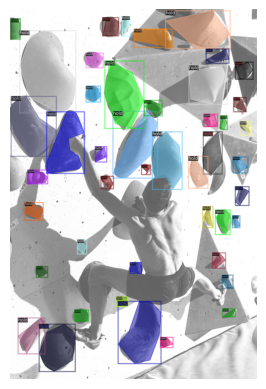

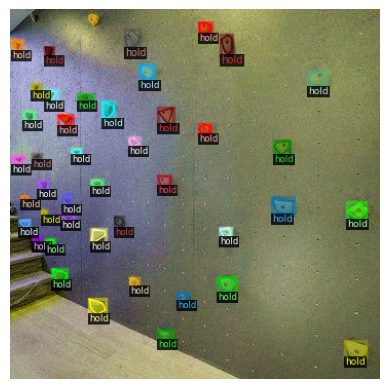

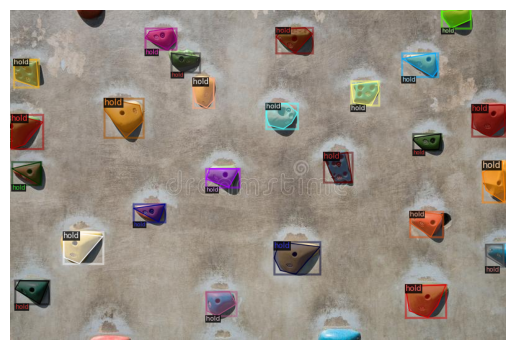

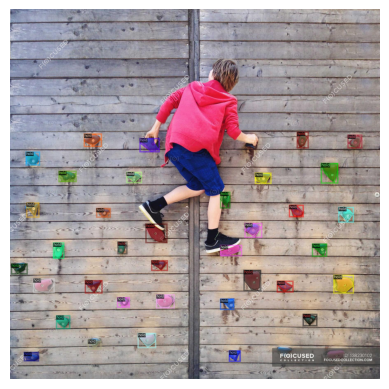

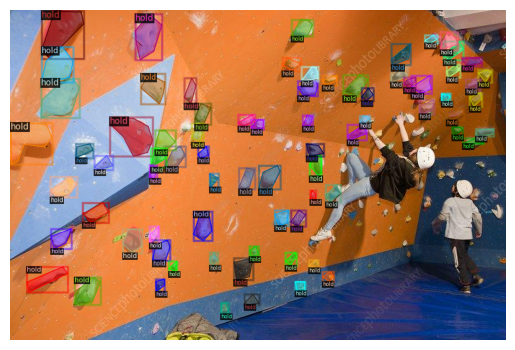

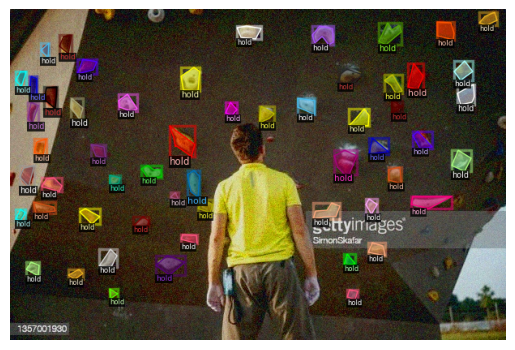

In [5]:
for d in random.sample(dataset_dicts, 9):
    file = d['file_name']
    file_name = os.path.basename(file)
    img = cv2.imread(file)
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    # fig.add_subplot(rows, columns, count)
    plt.imshow(out.get_image())
    plt.axis('off')
    plt.savefig(os.path.join(display_path, file_name), bbox_inches='tight')
    plt.show()

# Finetune existing model

Use Mask RCNN R-50-FPN 1X, same model as in this repo:
https://github.com/onnx/models/tree/master/vision/object_detection_segmentation/mask-rcnn

In [5]:
# set cofigurations
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml"))
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 8   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class. (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
cfg.OUTPUT_DIR = output_path

setup_logger(output_path)
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [6]:
from torch.optim.lr_scheduler import MultiStepLR, ReduceLROnPlateau, CosineAnnealingLR
from torch.optim import SGD

In [7]:
# build custom custom trainer with lr scheduler and optimizer
class CustomTrainer(DefaultTrainer):
    # build the learning rate scheduler
    def build_lr_scheduler(self, cfg, optimizer):
        scheduler = CosineAnnealingLR(optimizer, T_max=cfg.SOLVER.MAX_ITER, eta_min=cfg.SOLVER.BASE_LR / 10)
        return scheduler

    def build_optimizer(self, cfg, model):
        # params = [p for p in model.parameters() if p.requires_grad]
        optimizer = torch.optim.SGD(model.parameters(), lr=cfg.SOLVER.BASE_LR, momentum=0.9, weight_decay=0.0001)
        return optimizer

In [8]:
print(cfg.MODEL.DEVICE)

cuda


In [9]:
# trainer = DefaultTrainer(cfg) 
trainer = CustomTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[02/02 19:51:11 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[02/02 19:51:11 d2.engine.train_loop]: Starting training from iteration 0


c:\Users\user\Desktop\RCP\ClimbAssistant\.venv\lib\site-packages\torch\functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/02 19:51:29 d2.utils.events]:  eta: 0:08:20  iter: 19  total_loss: 2.198  loss_cls: 0.5434  loss_box_reg: 0.7584  loss_mask: 0.5734  loss_rpn_cls: 0.111  loss_rpn_loc: 0.1435  time: 0.4979  data_time: 0.1412  lr: 0.0002498  max_mem: 2757M
[02/02 19:51:40 d2.utils.events]:  eta: 0:08:10  iter: 39  total_loss: 1.807  loss_cls: 0.4202  loss_box_reg: 0.7569  loss_mask: 0.4216  loss_rpn_cls: 0.09  loss_rpn_loc: 0.1551  time: 0.5081  data_time: 0.0027  lr: 0.00024916  max_mem: 2757M
[02/02 19:51:50 d2.utils.events]:  eta: 0:08:07  iter: 59  total_loss: 1.578  loss_cls: 0.3345  loss_box_reg: 0.6705  loss_mask: 0.3503  loss_rpn_cls: 0.06098  loss_rpn_loc: 0.1526  time: 0.5199  data_time: 0.0030  lr: 0.00024807  max_mem: 2757M
[02/02 19:52:01 d2.utils.events]:  eta: 0:07:57  iter: 79  total_loss: 1.502  loss_cls: 0.3099  loss_box_reg: 0.6105  loss_mask: 0.3243  loss_rpn_cls: 0.071  loss_rpn_loc: 0.1554  time: 0.5218  data_time: 0.0027  lr: 0.00024655  max_mem: 2757M
[02/02 19:52:11 d2.utils

In [9]:
# Look at training curves in tensorboard:
# %load_ext tensorboard
# %tensorboard --logdir 'C:/Users/user/Desktop/boulder photos/iter2/output'

In [10]:
# get training metrics to plot from metrics.json file
json_file = os.path.join(output_path, "metrics.json")
metrics = []
for line in open(json_file, 'r'):
  metrics.append(json.loads(line))
print(metrics[0])

# load them into a df for easy access
df = pd.DataFrame(metrics)

{'data_time': 0.0024938000133261085, 'eta_seconds': 500.4419489344582, 'fast_rcnn/cls_accuracy': 0.75, 'fast_rcnn/false_negative': 1.0, 'fast_rcnn/fg_cls_accuracy': 0.0, 'iteration': 19, 'loss_box_reg': 0.7583933472633362, 'loss_cls': 0.5434376001358032, 'loss_mask': 0.5734127759933472, 'loss_rpn_cls': 0.11097846180200577, 'loss_rpn_loc': 0.14348328858613968, 'lr': 0.0002497996448437987, 'mask_rcnn/accuracy': 0.8338647959183674, 'mask_rcnn/false_negative': 0.08970317835566062, 'mask_rcnn/false_positive': 0.22591073963097302, 'roi_head/num_bg_samples': 6.0, 'roi_head/num_fg_samples': 2.0, 'rpn/num_neg_anchors': 152.5, 'rpn/num_pos_anchors': 103.5, 'time': 0.5106550499331206, 'total_loss': 2.1983445957303047}


0.9375
0.75
0.8761160714285714


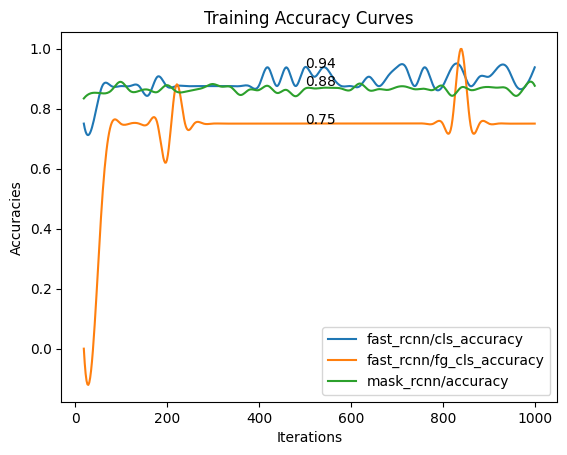

In [11]:
x = df['iteration'].to_numpy()

accuracies = ['fast_rcnn/cls_accuracy', 'fast_rcnn/fg_cls_accuracy', 'mask_rcnn/accuracy']

# plot each of the accuracy metrics
for accuracy in accuracies:
  y = df[accuracy].to_numpy()
  print(y[-1])
  # smoothen out the curves
  X_Y_Spline = make_interp_spline(x, y)

  # Returns evenly spaced numbers
  # over a specified interval.
  X_ = np.linspace(x.min(), x.max(), 500)
  Y_ = X_Y_Spline(X_)
  # Plotting the Graph
  plt.plot(X_, Y_, label=accuracy)
  plt.text(500, y[-1], round(y[-1],2)) # plot the last value
  plt.title("Training Accuracy Curves")
  plt.xlabel("Iterations")
  plt.ylabel("Accuracies")
  plt.legend()
plt.savefig(os.path.join(display_path, 'accuracy.jpeg'))
plt.show()

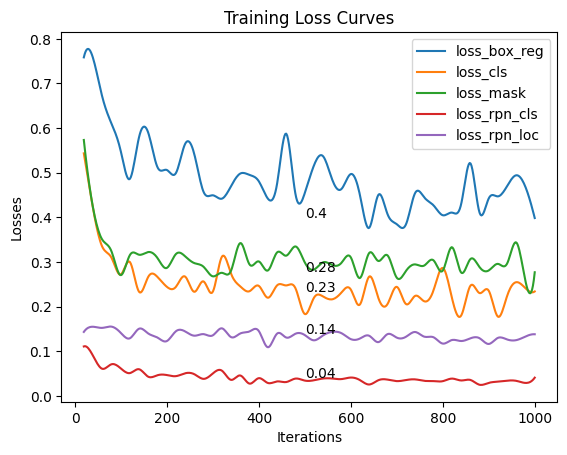

In [12]:
x = df['iteration'].to_numpy()

losses = ['loss_box_reg', 'loss_cls', 'loss_mask', 'loss_rpn_cls', 'loss_rpn_loc']

# plot each of the accuracy metrics
for loss in losses:
  y = df[loss].to_numpy()
  # smoothen out the curves
  X_Y_Spline = make_interp_spline(x, y)

  # Returns evenly spaced numbers
  # over a specified interval.
  X_ = np.linspace(x.min(), x.max(), 500)
  Y_ = X_Y_Spline(X_)

  # Plotting the Graph
  plt.plot(X_, Y_, label=loss)
  plt.text(500, y[-1], round(y[-1],2)) # plot the last value
  plt.title("Training Loss Curves")
  plt.xlabel("Iterations")
  plt.ylabel("Losses")
  plt.legend()
plt.savefig(os.path.join(display_path, 'loss.jpeg'))
plt.show()

# Run inference on validation set

In [13]:
# register validation dataset
val_path = 'C:/Users/user/Desktop/boulder photos/iter2/val/'

register_coco_instances("val", {}, f'{val_path}/annotations.json', val_path)
val_dicts = DatasetCatalog.get('val')
val_metadata = MetadataCatalog.get('val')

WARNING [02/02 20:00:56 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/02 20:00:56 d2.data.datasets.coco]: Loaded 14 images in COCO format from C:/Users/user/Desktop/boulder photos/iter2/val//annotations.json
WARNING [02/02 20:00:56 d2.data.datasets.coco]: Filtered out 5 instances without valid segmentation. There might be issues in your dataset generation process.  Please check https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html carefully


In [14]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[02/02 20:01:02 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from C:/Users/user/Desktop/boulder photos/iter3/output_lrplateau\model_final.pth ...


visualize some samples

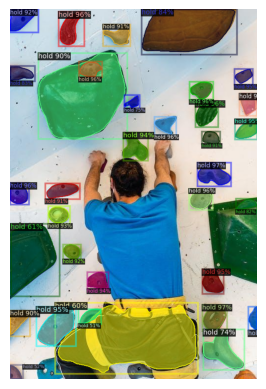

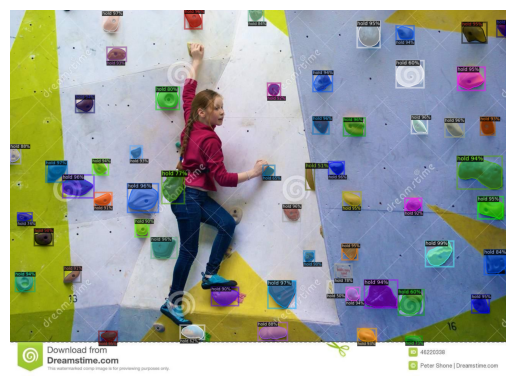

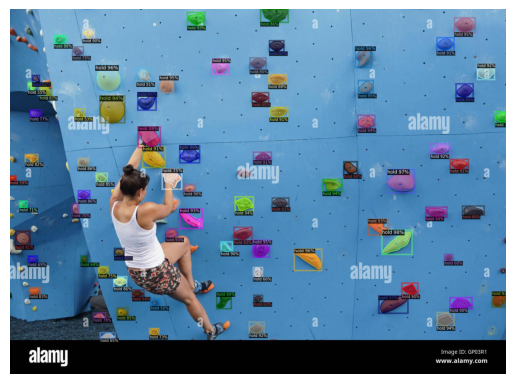

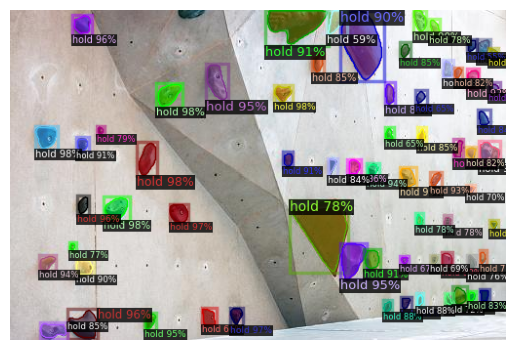

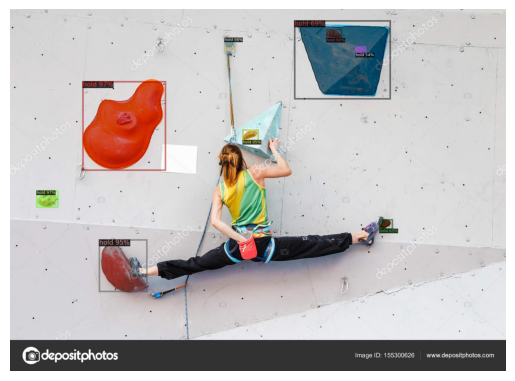

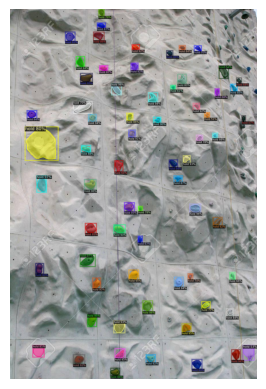

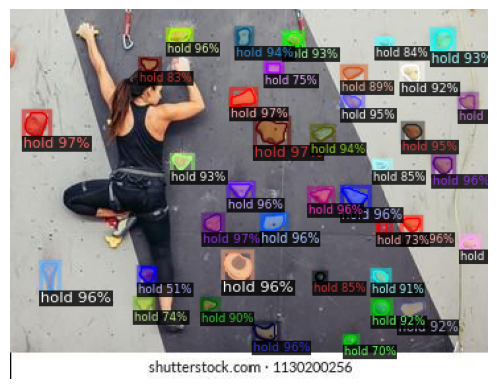

In [15]:
for d in random.sample(val_dicts, 7):    
    im = cv2.imread(d["file_name"])
    file_name = 'val_' + os.path.basename(d["file_name"])
    
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata= val_metadata, 
                   scale=1,
                   instance_mode=ColorMode.SEGMENTATION   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    plt.imshow(out.get_image())
    plt.axis('off')
    plt.savefig(os.path.join(display_path, file_name), bbox_inches='tight')
    plt.show()

In [16]:
evaluator = COCOEvaluator("val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "val")
results = inference_on_dataset(predictor.model, val_loader, evaluator)
print(results)

[02/02 20:01:20 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [02/02 20:01:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/02 20:01:20 d2.data.datasets.coco]: Loaded 14 images in COCO format from C:/Users/user/Desktop/boulder photos/iter2/val//annotations.json
WARNING [02/02 20:01:20 d2.data.datasets.coco]: Filtered out 5 instances without valid segmentation. There might be issues in your dataset generation process.  Please check https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html carefully
[02/02 20:01:20 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[02/02 20:01:20 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[02/02 20:01:20 d2.data.common]: Serializing 14 elements to

## Save training and validation performances

In [17]:
with open(os.path.join(display_path, "performance.json")) as f:
    stats = json.load(f)
print(stats)

{'accuracy': {}, 'loss': {}, 'AP': {}, 'configs': {}}


In [18]:
stats['configs'] = cfg

In [19]:
final = df.iloc[-1:] # get only the last training output in DF format

for accuracy in accuracies:
    stats['accuracy'][accuracy] = final[accuracy].values[0]

for loss in losses:
    stats['loss'][loss] = final[loss].values[0]

In [20]:
AP = json.loads(json.dumps(results)) # convert OrderedDict to dict
stats['AP'] = AP

In [21]:
# save new info back to performance json
with open(os.path.join(display_path, 'performance.json'), 'w') as f:
    json.dump(stats, f)